In [135]:
#import fwiVis.fwiVis as fv
import s3fs
s3 = s3fs.S3FileSystem(anon=False)
from math import cos, asin, sqrt
import re

import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib import pyplot as plt
import os
import rioxarray as rio
import xarray as xr
import rasterio
import glob
from geocube.api.core import make_geocube
from shapely.errors import ShapelyDeprecationWarning
from shapely.geometry import Point
import warnings
import folium
import datetime
import time
from folium import plugins
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 
import contextily as cx
from shapely.geometry import box
import sys
from datetime import datetime, timedelta

sys.path.insert(0, '/projects/old_shared/fire_weather_vis/base-fwi-vis/')
import fwiVis.fwiVis as fv

In [136]:
#### For each largefire, look within the "final" perimeter, identify all lightning strikes from 7 days before

#QuebecGlobalNRT_3571

#lg_ids = glob.glob("/projects/shared-buckets/gsfc_landslides/FEDSoutput-s3-conus/QuebecGlobalNRT_3571/2023/Largefire/")

#fr = fv.load_large_fire("1979", year = '2023', path_region="QuebecGlobalNRT_3571") ## Cluster of fires 62 -- industrial

fr = fv.load_large_fire("1462", year = '2023', path_region="QuebecGlobalNRT_3571") ## Cluster of 2 fires. 



['/projects/shared-buckets/gsfc_landslides/FEDSoutput-s3-conus/QuebecGlobalNRT_3571/2023/Largefire/F1462_20230825PM', '/projects/shared-buckets/gsfc_landslides/FEDSoutput-s3-conus/QuebecGlobalNRT_3571/2023/Largefire/F1462_20230826AM', '/projects/shared-buckets/gsfc_landslides/FEDSoutput-s3-conus/QuebecGlobalNRT_3571/2023/Largefire/F1462_20230826PM', '/projects/shared-buckets/gsfc_landslides/FEDSoutput-s3-conus/QuebecGlobalNRT_3571/2023/Largefire/F1462_20230827AM', '/projects/shared-buckets/gsfc_landslides/FEDSoutput-s3-conus/QuebecGlobalNRT_3571/2023/Largefire/F1462_20230827PM']


/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:583: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lon'] = gdf.centroid.x
/projects/old_shared/fire_weather_vis/base-fwi-vis/fwiVis/fwiVis.py:584: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['lat'] = gdf.centroid.y


In [316]:
fr.t = fr.t.astype("str")
fr.explore()

In [315]:

fr[fr.t == fr.t.min()].explore()

In [264]:
# Read in lightning data

files = glob.glob("/projects/old_shared/fire_weather_vis/Lightning_analysis/computed_data/Lt_CA_Quebec_*.csv")
def concat_subsets(files):
    df = []
    for f in files:
        manyfr = pd.read_csv(f)

        manyfr = gpd.GeoDataFrame(manyfr)

        manyfr.t = manyfr.t.astype("datetime64[ns]")
        df.append(manyfr)
    df = pd.concat(df)
    return(df)



lt= concat_subsets(files)
#test = concat_subsets(files)

In [266]:
min_threshold

Timestamp('2023-06-27 00:00:00')

In [139]:
### Possible lightning strikes

min_threshold = fr.t.astype('datetime64[ns]').min() - timedelta(days = 10)
possible_lt = lt[lt.t <= fr.t.min()]
possible_lt = possible_lt[possible_lt.t >= min_threshold]
#possible_lt
#possible_lt = possible_lt[possible_lt.isin.]
oldest_perim = fr[fr.t == fr.t.max()]

fr["perim_rank"] = fr.t.rank()

possible_lt = gpd.GeoDataFrame(possible_lt, geometry=gpd.points_from_xy(possible_lt.lon, possible_lt.lat), crs=4674)

join_lt = gpd.sjoin(possible_lt, oldest_perim, op = 'within', how = "inner")

#oldest_perim = fr[fr.t == fr.t.max()].geometry
#possible_lt = possible_lt[possible_lt.isin(oldest_perim)]

/projects/myenvs/fireatlas_oct4/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3318: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/tmp/ipykernel_1469/3363296765.py:14: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4674
Right CRS: EPSG:4326

  join_lt = gpd.sjoin(possible_lt, oldest_perim, op = 'within', how = "inner")


In [140]:
#join_lt[['t_left', 't_right', 'perim_rank', 'farea']]
join_lt
#print(len(join_lt))
#print(len(possible_lt))

,Unnamed: 0,InterCloud,t_left,lat_left,lon_left,current_mag,multiplicity_0,accr,error_elps,num_station,...,n_newpixels,farea,fperim,flinelen,duration,pixden,meanFRP,t_right,lon_right,lat_right
11015,3632912,0,2023-07-05 12:03:59.470,52.750766,-78.314010,8222.0,0,0.0,25.0,3.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
11016,3632911,0,2023-07-05 12:03:59.441,52.765755,-78.313420,20024.0,0,0.0,27.0,3.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
12859,6057589,0,2023-07-05 19:53:04.622,53.072052,-77.015471,9170.0,0,0.0,18.0,3.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
12861,6057609,0,2023-07-05 19:53:04.788,53.087080,-77.040321,19780.0,0,0.0,24.0,3.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
12864,6868596,0,2023-07-05 21:22:13.467,53.130557,-76.996927,-10307.0,0,0.0,12.0,1.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14613,3896447,0,2023-07-05 13:05:25.648,52.919166,-78.314767,-6906.0,0,0.0,15.0,2.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
14614,3904933,0,2023-07-05 13:07:34.726,52.978980,-78.313765,11668.0,0,0.0,32.0,4.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
14617,3640289,0,2023-07-05 12:05:32.946,52.757822,-78.458030,10452.0,0,0.0,34.0,3.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176
14627,3909757,0,2023-07-05 13:08:49.032,53.020625,-78.264021,-5267.0,0,0.0,16.0,6.0,...,490,4970.298703,825.272497,77.392445,51.5,8.357445,23.374061,2023-08-27 12:00:00,-77.674239,53.160176


In [190]:
join_lt.columns
join_lt = join_lt.to_crs("3571") ## NEED TO BE REAL DISTANCES

fr = fr.to_crs("3571")
first_geom = fr[fr.perim_rank == 1].geometry
print(type(first_geom))

#first_geom.index.values.astype("int")
#type(first_geom[7])
#first_geom[first_geom.index.values]
#type(first_geom)

#first_geom[first_geom.index.values.astype("int")]
first_geom = first_geom.iloc[0]

type(first_geom.geoms[0].centroid)
num_starts = len(first_geom.geoms)

### Loop over each mutli polygon and calculate distance to it in a new column. 
### https://geopandas.org/en/stable/docs/user_guide/mergingdata.html
#starts_centriod = []
for i in range(0, num_starts):
    join_lt["dist_start_" + str(i)] = join_lt.distance(first_geom.geoms[i].centroid)

<class 'geopandas.geoseries.GeoSeries'>


In [278]:
range_geoms = list(range(0, num_starts))
string = "dist_start_"
columns_dists = [string + str(x) for x in range_geoms]



#join_lt["probable_ig"] = 

#for col in columns_dists
top = len(join_lt) * 0.1
dist_bool = join_lt[columns_dists].rank() <= top ## NEED a max distance cutoff. 

join_lt["candidate"] = dist_bool.any(axis = 1)


#"dist_start_" + str(*range(0, num_starts))
#range(0, num_starts)

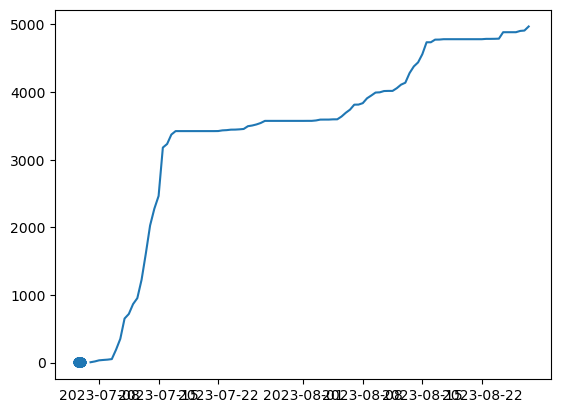

In [259]:
# #plt.plot(join_lt[join_lt.candidate].t_left, join_lt[join_lt.candidate].candidate)

# fr = fr.sort_values(by = ['t'])
# plt.plot(fr.t.astype("datetime64[ns]"), fr.farea)
# plt.scatter(join_lt[join_lt.candidate].t_left, join_lt[join_lt.candidate].candidate)


In [279]:
#fr[fr.perim_rank == 1].plot()
candidate = join_lt[join_lt.candidate == True]

In [273]:
len(candidate)

35

In [260]:
date_range = pd.date_range(start = "2023-07-05 00:00:00", end = "2023-07-06 00:00:00", freq="24H")

date_snap = date_range.strftime("%Y%m%d")
date_snap
nice_dates = date_range.strftime("%Y-%m-%d")

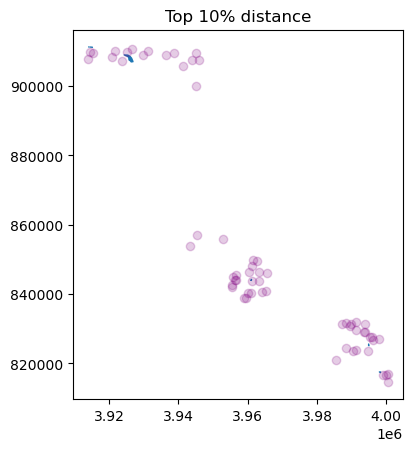

In [296]:
bbox = [-83.69877641421793, 44.25483911637959, -55, 62.94135765648493] 


plt.figure()
ax = plt.subplot()
plot = fr[fr.perim_rank == 1].plot(ax = ax)
#plot.set_xlim(bbox[0], bbox[2])
#plot.set_ylim(bbox[1], bbox[3])
candidate.plot(ax = ax, color = "purple", alpha = 0.2)
#cx.add_basemap(plot, crs=join_lt.crs, attribution = False)
ax.set_title("Top 10% distance")
plt.show()

In [291]:
#s3.ls('s3://veda-data-store-staging/EIS/other/station-FWI/19900101.NRT/FWI')

In [292]:
#### Look agaisnt station data


#st = pd.read_csv("/projects/old_shared/Quebec_fwi_viz/718270-99999.linear.DailyFWIfromHourlyInterp.csv") ## Corrected record from Robert
st = pd.read_csv("s3://veda-data-store-staging/EIS/other/station-FWI/19900101.NRT/FWI/718270-99999.linear.DailyFWIfromHourlyInterp.csv") ## Corrected record from Robert

st['HH'] = '12'
st.YYYY = st.YYYY.astype("int")
st.MM = st.MM.astype("int")
st.DD = st.DD.astype("int")
st = fv.date_convert(st)

st['MM_DD'] = st['time'].apply(lambda x: x.strftime('%m-%d'))

#st['ismayjune'] = np.logical_or((st.MM == 6), (st.MM == 5))
st['ismayjune'] = st.MM.isin([7, 8]) # Is May, June or July? 
mj = st[st['ismayjune'] == True]
mj = mj.set_index("time")
#st = st.set_index("time")

mj = mj[mj.index > "1991-01-01 00:00:00"]
mj = mj[mj.index < "2020-12-31 23:00:00"]

#
mean_quant = mj.groupby([mj.index.day, mj.index.month]).mean()

dates = ("2023-" + mean_quant.index.get_level_values(level=1).astype("str") + "-" + mean_quant.index.get_level_values(level=0).astype("str"))

mean_quant["dates"] = pd.to_datetime(dates)
mean_quant = mean_quant.sort_values(by = "dates")
mean_quant.set_index("dates", inplace = True)


upper = mj.groupby([mj.index.day, mj.index.month]).quantile((1-0.025))
upper["dates"] = pd.to_datetime(dates)
upper = upper.sort_values(by = "dates")
upper.set_index("dates", inplace = True)

lower = mj.groupby([mj.index.day, mj.index.month]).quantile(0.025)
lower["dates"] = pd.to_datetime(dates)
lower = lower.sort_values(by = "dates")
lower.set_index("dates", inplace = True)


mid_lower = mj.groupby([mj.index.day, mj.index.month]).quantile(0.25)
mid_lower["dates"] = pd.to_datetime(dates)
mid_lower = mid_lower.sort_values(by = "dates")
mid_lower.set_index("dates", inplace = True)


mid_upper = mj.groupby([mj.index.day, mj.index.month]).quantile(0.75)
mid_upper["dates"] = pd.to_datetime(dates)
mid_upper = mid_upper.sort_values(by = "dates")
mid_upper.set_index("dates", inplace = True)

/tmp/ipykernel_1469/948046364.py:25: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_quant = mj.groupby([mj.index.day, mj.index.month]).mean()
/tmp/ipykernel_1469/948046364.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  upper = mj.groupby([mj.index.day, mj.index.month]).quantile((1-0.025))
/tmp/ipykernel_1469/948046364.py:39: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  lower = mj.groupby([mj.index.d

First detection: 2023-07-07 00:00:00
2023-07-05 11:58:28.014000
2023-07-05 21:47:42.789000


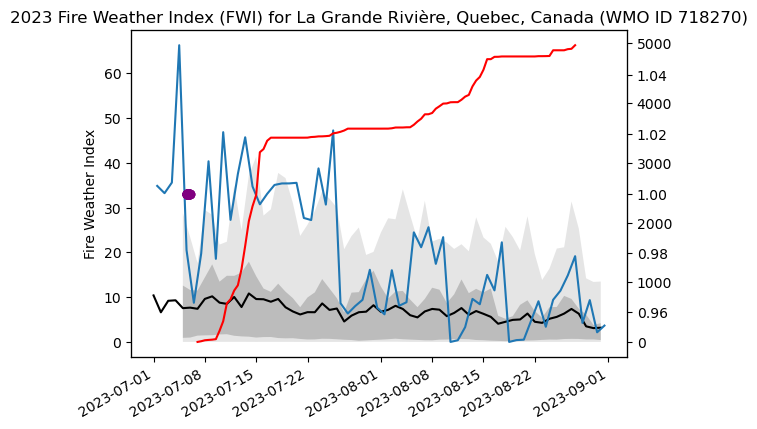

In [312]:
fig, ax = plt.subplots()
ax.fill_between(upper.index, upper.FWI.rolling(1).mean(), lower.FWI.rolling(5).mean(), 
                facecolor='grey', 
                alpha=0.2,
                label= "95th Percentile")
ax.fill_between(mid_upper.index, mid_upper.FWI.rolling(1).mean(), mid_lower.FWI.rolling(5).mean(), 
                facecolor='grey', 
                alpha=0.4,
                label= "25th Percentile")
ax.plot(mean_quant.index, mean_quant.FWI.rolling(1).mean(), 
        color = "black",
        label= "Historic Mean Per Day")
ax.plot(st[(st.time >= "2023-07-01")].time.astype('datetime64[ns]'), st[(st.time >= "2023-07-01")].FWI)
ax.set_ylabel("Fire Weather Index")
ax.set_title("2023 Fire Weather Index (FWI) for La Grande Rivière, Quebec, Canada (WMO ID 718270)")
#ax.legend()
ax2 = ax.twinx()
ax2.scatter(candidate.t_left, candidate.candidate, color = "purple")
#ax2.plot(fire_stats.t, fire_stats.num_active_fires, color = "red", label = "Number of Fires in Quebec")
#ax2.legend(loc = 0.5)
ax3 = ax.twinx()
ax3.plot(fr.t.astype("datetime64[ns]"), fr.farea, color = "red")
#ax3.plot(day_strike.index.astype("datetime64[ns]"), day_strike.InterCloud, color = "orange")
fig.autofmt_xdate()

print("First detection: " + str(fr.t.astype("datetime64[ns]").min()) )
print(candidate.t_left.min())
print(candidate.t_left.max())

2023-07-05 11:58:28.014000
2023-07-05 21:47:42.789000


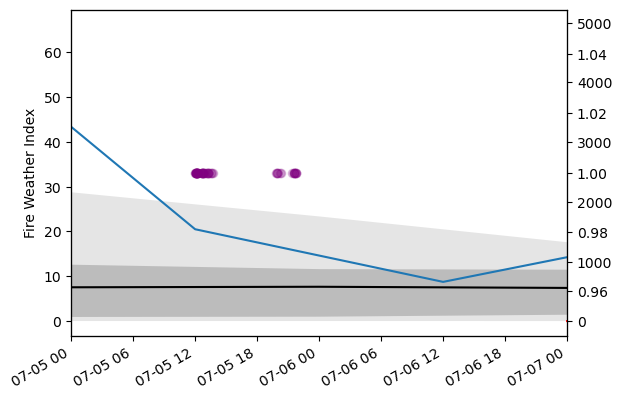

In [313]:
import datetime

fig, ax = plt.subplots()
ax.fill_between(upper.index, upper.FWI.rolling(1).mean(), lower.FWI.rolling(5).mean(), 
                facecolor='grey', 
                alpha=0.2,
                label= "95th Percentile")
ax.fill_between(mid_upper.index, mid_upper.FWI.rolling(1).mean(), mid_lower.FWI.rolling(5).mean(), 
                facecolor='grey', 
                alpha=0.4,
                label= "25th Percentile")
ax.plot(mean_quant.index, mean_quant.FWI.rolling(1).mean(), 
        color = "black",
        label= "Historic Mean Per Day")
ax.plot(st[(st.time >= "2023-07-01")].time.astype('datetime64[ns]'), st[(st.time >= "2023-07-01")].FWI)
ax.set_ylabel("Fire Weather Index")
#ax.set_title("2023 Fire Weather Index (FWI) for La Grande Rivière, Quebec, Canada (WMO ID 718270)")
ax.set_xlim([datetime.date(2023, 7, 5), datetime.date(2023, 7, 7)])
#ax.legend()
ax2 = ax.twinx()
ax2.scatter(candidate.t_left, candidate.candidate, color = "purple", alpha = 0.2)
#ax2.plot(fire_stats.t, fire_stats.num_active_fires, color = "red", label = "Number of Fires in Quebec")
#ax2.legend(loc = 0.5)
ax3 = ax.twinx()
ax3.plot(fr.t.astype("datetime64[ns]"), fr.farea, color = "red")
#ax3.plot(day_strike.index.astype("datetime64[ns]"), day_strike.InterCloud, color = "orange")
fig.autofmt_xdate()


print(candidate.t_left.min())
print(candidate.t_left.max())

In [314]:
### TO DO may-started fire

In [314]:
### TO DO: Get raw timing of the VIIRS obsevations??

In [ ]:
### TO DO: Keep information for the number of active pixels PER IGNITION and frp PER PIXEL



In [ ]:
## We want to get the period between 